## CMPINF 2100: Homework 07

### Arnab Dey Sarkar

## Assigned: Tuesday of Week 07 at 11:00PM

## DUE: Tuesday of Week 08 at 11:59PM

## Overview

This assignment is focused on exploring categorical-to-continuous variable relationships **and** continuous-to-continuous variable relationships. It is **not** open ended like the last two assignments. There are certain tasks you must complete for all problems, but you will gain experience with the different plot types introduced in the Week 07 recordings. You will practice creating, modifying, interpreting, and communicating insights from them. The last question requires you to visually explore **relationships** associated with one of the final projects of your choosing.

**You must download the 3 data sets provided in the Canvas assignment page and save them to the appropriate directory on your computer.**

### Collaborators

Type the names of other students you worked with here.

## Required tasks for Problem 01, 02, and 04

For each of the 3 assigned data sets you must perform the following **ESSENTIAL** activities:

* Display the number of rows and columns in the dataset  
* Display the names of the columns and their associated data types  
* Display the number of unique values for each column  
* Display the number of MISSING values for each column  

You do **NOT** need to display basic descriptive statistics and counts. You will **visually** explore the variables in each problem.


## Problem 00

You will work with the NumPy, Pandas, matplotlib.pyplot, and Seaborn modules in this assignment.

Import NumPy, Pandas, matplotlib.pyplot, and Seaborn using their commonly accepted aliases.

#### 00) - SOLUTION

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

## Problem 01

### 1a)

Read in the `hw07_prob_01.csv` CSV file and assign it to the `df01` object.

#### 1a) - SOLUTION

In [2]:
df01=pd.read_csv("hw07_prob_01.csv")

### 1b)

Perform the ESSENTIAL Exploratory Data Analysis (EDA) tasks.

Add as many cells as you feel are necessary.

#### 1b) SOLUTION

In [3]:
df01

,x,value
0,A,10.079154
1,B,10.899639
2,C,2.169568
3,D,5.002276
4,A,6.715621
...,...,...
2795,D,-0.739087
2796,A,3.368663
2797,B,1.561011
2798,C,0.438753


In [4]:
df01.shape

(2800, 2)

In [5]:
df01.dtypes

x         object
value    float64
dtype: object

In [6]:
df01.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       2800 non-null   object 
 1   value   2800 non-null   float64
dtypes: float64(1), object(1)
memory usage: 43.9+ KB


In [7]:
df01.x.value_counts()

A    700
B    700
C    700
D    700
Name: x, dtype: int64

In [8]:
df01.nunique()

x           4
value    2800
dtype: int64

In [9]:
df01.isna().sum()

x        0
value    0
dtype: int64

In [10]:
df01.describe()

,value
count,2800.000000
mean,3.602424
std,3.092654
min,-5.421891
25%,1.301328
50%,3.040259
75%,5.619022
max,20.348324


In [11]:
df01_summary_info=df01.groupby(['x'], dropna=False).\
    aggregate(value_rows=('value', 'size'),
              value_nonmiss=('value', 'count'),
              value_min=('value', 'min'),
              value_mean=('value', 'mean'),
              value_max=('value', 'max'),
              value_sem=('value', 'sem'),
              value_unique=('value','nunique')
              ).\
reset_index()

In [12]:
df01_summary_info

,x,value_rows,value_nonmiss,value_min,value_mean,value_max,value_sem,value_unique
0,A,700,700,-1.082039,4.489812,15.105555,0.130043,700
1,B,700,700,-5.421891,3.447927,12.231985,0.111557,700
2,C,700,700,0.025424,3.263984,20.348324,0.111404,700
3,D,700,700,-1.545187,3.207971,8.046591,0.106765,700


We have 2800 of different numeric data divided *equally* into 4 categories A,B,C,D. None has any missing value. The lowest numeric data is -5.421891 occurs in group B and the highest numeric data is 20.348324 occurs in group C. The mean has the highest variability in group A.

### 1c)

Create a BAR CHART using Seaborn to show the COUNTS for the non-numeric column in `df01`.

Are the unique values BALANCED?

#### 1c) - SOLUTION

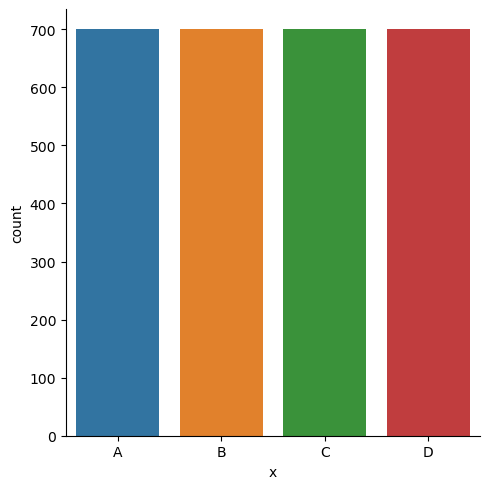

In [13]:
sns.catplot(data=df01, x='x', kind='count')
plt.show()

The unique values are equally distributed accross `x`. They are balanced.

### 1d)

Create a HISTOGRAM using Seaborn to visualize the **marginal** distribution of the continuous variable in `df01`.

Does the marginal distribution appear symmetric?

#### 1d) - SOLUTION

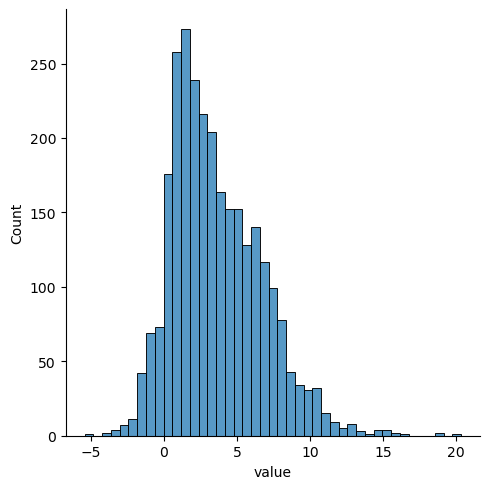

In [14]:
sns.displot(data=df01,x='value', kind='hist')

The data is more or less normal. A little bit skewed to the right.

### 1e)

You will now explore the categorical-to-continuous relationship between the non-numeric column and numeric column in `df01`.

Create a BOX PLOT using Seaborn to visualize the **summary statistics** of the numeric column **GIVEN** the non-numeric column.

Do the CONDITIONAL DISTRIBUTIONS appear DIFFERENT according to the BOX PLOT?

#### 1e) - SOLUTION

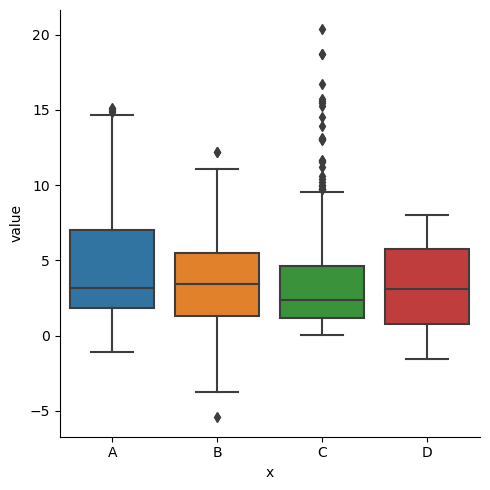

In [15]:
sns.catplot(data=df01, x='x', y='value', kind='box')
plt.show()

Medians vary accross categories. A(highest as we saw in EDA), D have the high variabilities and C is the least variable. C also has the highest extreme values(outliers). 

### 1f)

Create a POINT PLOT using Seaborn to compare the **conditional means** of the numeric column **GIVEN** the non-numeric column.

Are the averages of the numeric column DIFFERENT across the CATEGORIES of the non-numeric column?

#### 1f) - SOLUTION

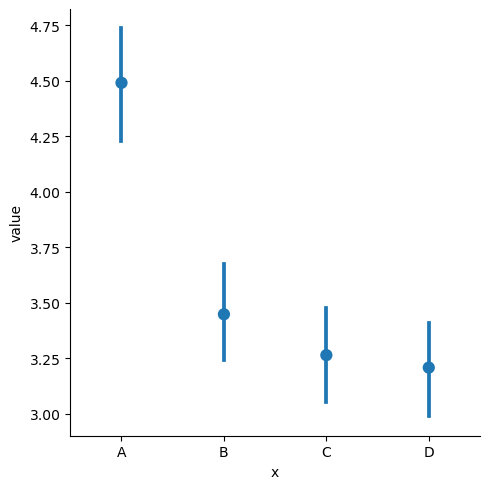

In [16]:
sns.catplot(data=df01, x='x', y='value', kind='point', join=False)
plt.show()

95% CI (t dist) for A is clearly seperated from the rest. We can conclude that we are 95% confident that the average for A is different and higher than the rest. For B,C,D although the means are decreasing for this sample; we are not confident that they will be different in general.

### 1g)

Create a VIOLIN PLOT using Seaborn to visualize the **conditional density** of the numeric column **GIVEN** the non-numeric column.

Do the CONDITIONAL DISTRIBUTIONS appear DIFFERENT according to the VIOLIN PLOT?

#### 1g) - SOLUTION

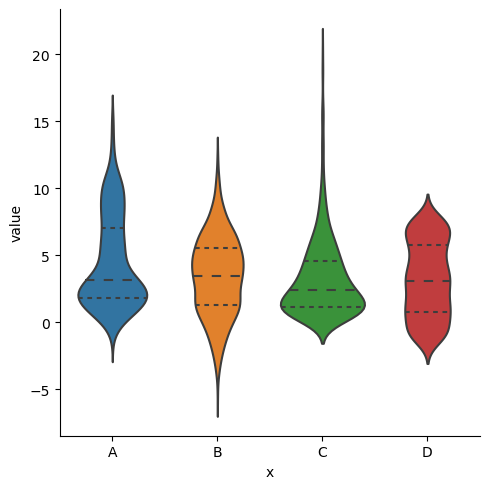

In [17]:
sns.catplot(data=df01, x='x', y='value', kind='violin', inner='quartile')
plt.show()

Yes, the conditional distributions are different. In B, D the distribution is summetric where as in A, C the distribution is right skewed.

### 1h) 

Create a CONDITIONAL KDE plot using Seaborn to show the **conditional density** of the numeric column **GIVEN** the non-numeric column. The non-numeric column **must** be associated with the KDE color.

Do the CONDITIONAL DISTRIBUTIONS appear DIFFERENT according to the CONDITIONAL KDE plot?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the color to a column in the data?

*HINT*: What do you need to set to make sure the SAMPLE SIZE effect is removed?

#### 1h) - SOLUTION

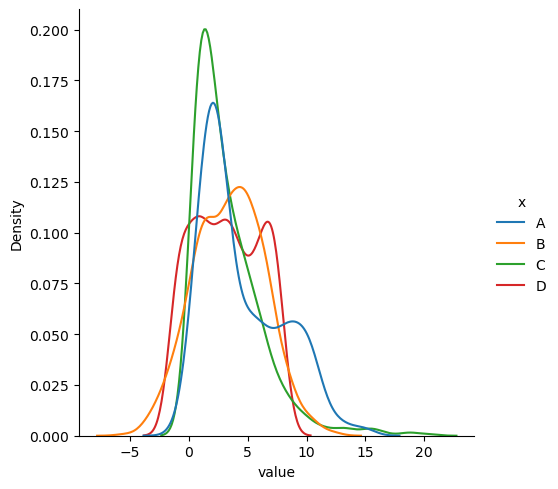

In [18]:
sns.displot(data=df01, x='value',hue='x', kind='kde', common_norm=False)
plt.show()

The kde plots support are violin plot conclusions. The conditional distributions are different. In B, D the distribution is summetric where as in A, C the distribution is right skewed. Here we can observe additionally that C has even more concentration around 0 than A.

`hue` is responsible to add colors corresponding to different categories.
`common_norm=False` removes the sample size effect although in this data all the categories have same no 700 of observations and hence, common_norm is not effective.

### 1i)

Create a FACTED HISTOGRAM plot using Seaborn to show the **conditional histogram** of the numeric column **GIVEN** the non-numeric column. The non-numeric column **must** be associated with the COLUMN FACETS. The x and y scales of the facets must be **free** or not-shared across the facets.

Do the CONDITIONAL DISTRIBUTIONS appear DIFFERENT according to the FACTED HISTOGRAM?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the COLUMN FACET to a column in the data?

#### 1i) - SOLUTION

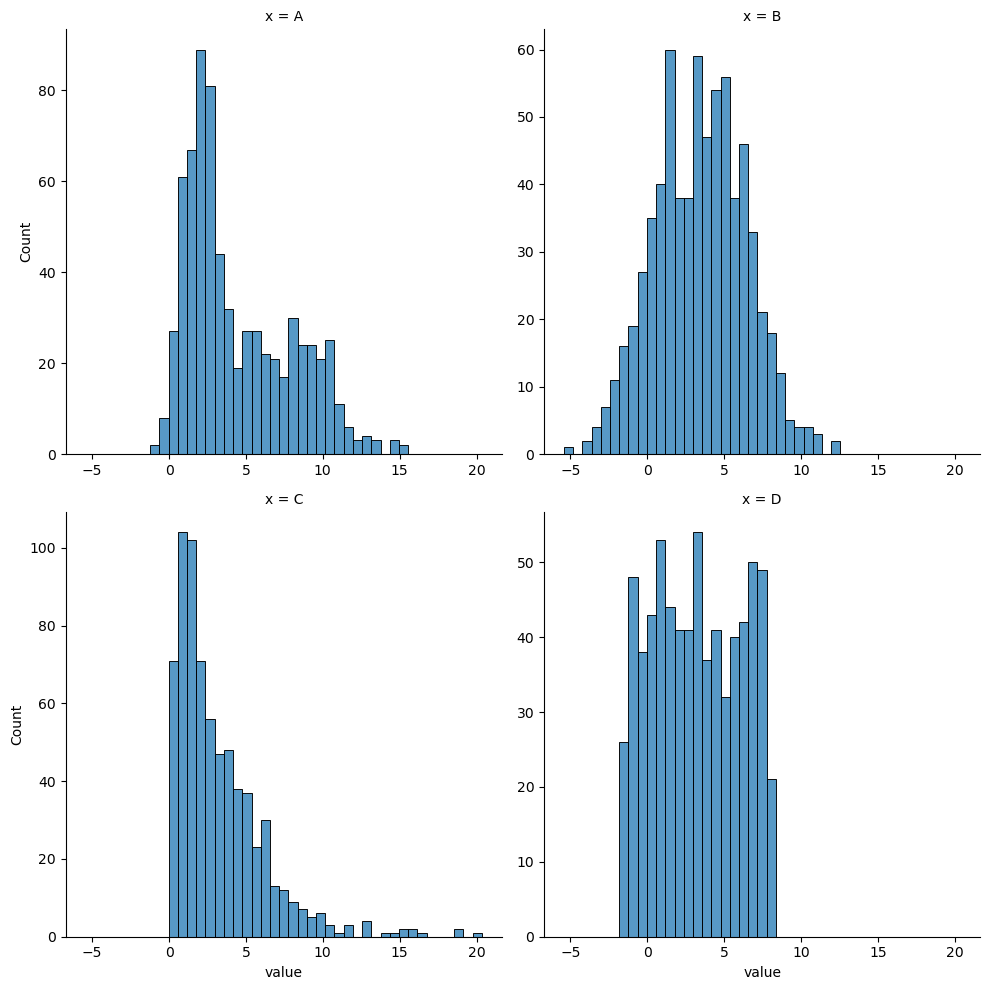

In [19]:
sns.displot(data=df01, x='value',col='x', kind='hist',\
    col_wrap=2, facet_kws={'sharex': False, 'sharey': False})
plt.show()

The conditional distributions are different. B has the symmetric, more or less normal distribution and D has the symmetric, more or less uniform distribution where as A,C are right skewed. C is almost fully skewed.

`col=` under Seaborn `displot` argument allows us to ASSOCIATE or link the COLUMN FACET to a column in the data.

### 1j)

You have explored the CONDITIONAL DISTRIBUTIONS of the numeric column **GIVEN** the non-numeric column.

Which plot types made it easy to COMPARE summary statistics across the categories?

Which plot types made it easy to COMPARE the distributional SHAPE across the categories?

#### 1j) - SOLUTION

I feel violin plot made it easy to COMPARE summary statistics across the categories and kde plot makes it easier to COMPARE the distributional SHAPE across the categories.

## Problem 02

### 2a)

Read in the `hw07_prob_02.csv` CSV file and assign it to the `df02` object.

#### 2a) - SOLUTION

In [20]:
df02=pd.read_csv("hw07_prob_02.csv")

### 2b)

Perform the ESSENTIAL Exploratory Data Analysis (EDA) tasks.

Add as many cells as you feel are necessary.

#### 2b) SOLUTION

In [21]:
df02

,x1,x2,m1
0,-1.244161,1.278363,A
1,-1.180081,1.198855,A
2,-0.658225,0.713579,A
3,0.390327,-0.487877,A
4,-0.015277,-0.049614,A
...,...,...,...
895,1.221421,1.475893,I
896,0.353086,0.487289,I
897,0.090534,0.121304,I
898,-0.826389,-0.983525,I


In [22]:
df02.shape

(900, 3)

In [23]:
df02.dtypes

x1    float64
x2    float64
m1     object
dtype: object

In [24]:
df02.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      900 non-null    float64
 1   x2      900 non-null    float64
 2   m1      900 non-null    object 
dtypes: float64(2), object(1)
memory usage: 21.2+ KB


In [25]:
df02.isna().sum()

x1    0
x2    0
m1    0
dtype: int64

In [26]:
df02.nunique()

x1    900
x2    900
m1      9
dtype: int64

In [27]:
def count_missing(series):
    return series.isna().sum()

df02_summary_info = df02.groupby(['m1'], dropna=False).\
    aggregate(x1_rows=('x1', 'size'),
              x1_nonmiss=('x1', 'count'),
              x1_miss=('x1',count_missing),
              x1_min=('x1', 'min'),
              x1_mean=('x1', 'mean'),
              x1_max=('x1', 'max'),
              x1_sem=('x1', 'sem'),
              x1_unique=('x1', 'nunique'),
              x2_rows=('x2', 'size'),
              x2_nonmiss=('x2', 'count'),
              x2_miss=('x2',count_missing),
              x2_min=('x2', 'min'),
              x2_mean=('x2', 'mean'),
              x2_max=('x2', 'max'),
              x2_sem=('x2', 'sem'),
              x2_unique=('x2', 'nunique')
              ).\
    reset_index()


In [28]:
df02_summary_info

,m1,x1_rows,x1_nonmiss,x1_miss,x1_min,x1_mean,x1_max,x1_sem,x1_unique,x2_rows,x2_nonmiss,x2_miss,x2_min,x2_mean,x2_max,x2_sem,x2_unique
0,A,100,100,0,-2.361043,0.091667,2.970587,0.102270,100,100,100,0,-2.940527,-0.073645,2.374314,0.101130,100
1,B,100,100,0,-2.202832,0.083659,2.794577,0.104235,100,100,100,0,-2.250538,-0.052223,2.416286,0.098140,100
2,C,100,100,0,-3.435065,-0.079557,2.281274,0.098465,100,100,100,0,-2.648666,0.040023,2.726775,0.094518,100
3,D,100,100,0,-2.310966,-0.075117,2.585018,0.109554,100,100,100,0,-2.479288,0.179923,2.527816,0.103563,100
4,E,100,100,0,-2.701852,0.015560,2.465939,0.095035,100,100,100,0,-2.263450,-0.123164,2.564615,0.098234,100
5,F,100,100,0,-2.572121,-0.127923,2.707330,0.109105,100,100,100,0,-2.511288,0.052244,2.536549,0.118507,100
6,G,100,100,0,-2.121500,-0.039613,3.068722,0.105044,100,100,100,0,-2.507380,0.038718,2.886683,0.111675,100
7,H,100,100,0,-2.728041,0.041222,2.996371,0.105815,100,100,100,0,-2.326055,0.033702,2.727422,0.100438,100
8,I,100,100,0,-2.329354,0.265349,2.860297,0.103347,100,100,100,0,-2.168624,0.259289,2.753163,0.103595,100


We have 900 of rows divided equally into 9 categories A to I. None has any missing value. The lowest x1 numeric data is -3.43 occurs in group C and the highest x1 numeric data is 3 occurs in group G. The x1 mean is maximum in I and has the highest variability in group D. Similarly we can do in x2 but I will leave it for visual explanation.

### 2c)

Create a BAR CHART using Seaborn to show the COUNTS for the non-numeric column in `df02`.

Are the unique values BALANCED?

#### 2c) - SOLUTION

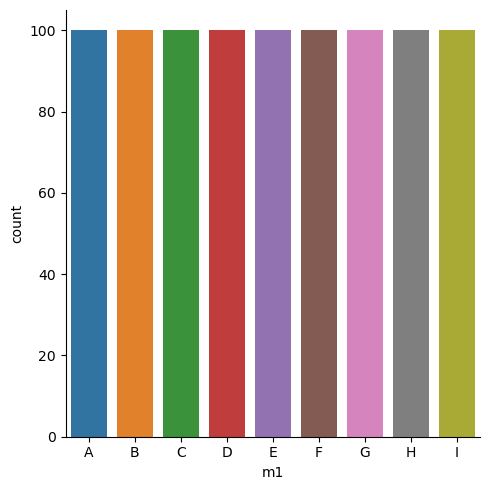

In [29]:
sns.catplot(data=df02, x='m1', kind='count')
plt.show()

The unique values are equally distributed accross m1. They are balanced.


### 2d)

Create HISTOGRAMS using Seaborn to visualize the **marginal** distributions of the continuous variables in `df02`.

You may create separate figures for each histogram based on the WIDE FORMAT data **OR** reshape the data into LONG FORMAT and create separate FACETS for each variable. You **CANNOT** use for-loops to create the separate histograms.

Do the marginal distribution appear symmetric?

#### 2d) - SOLUTION

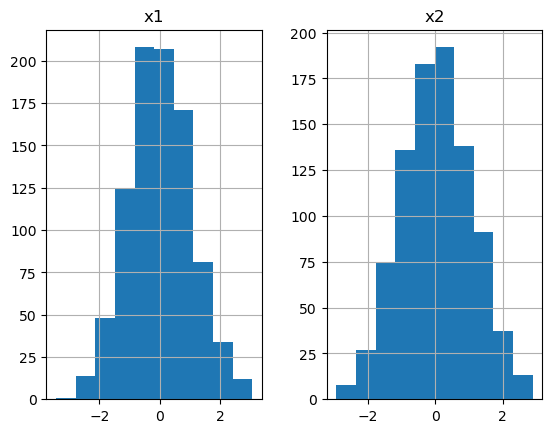

In [30]:
df02.hist()

plt.show()

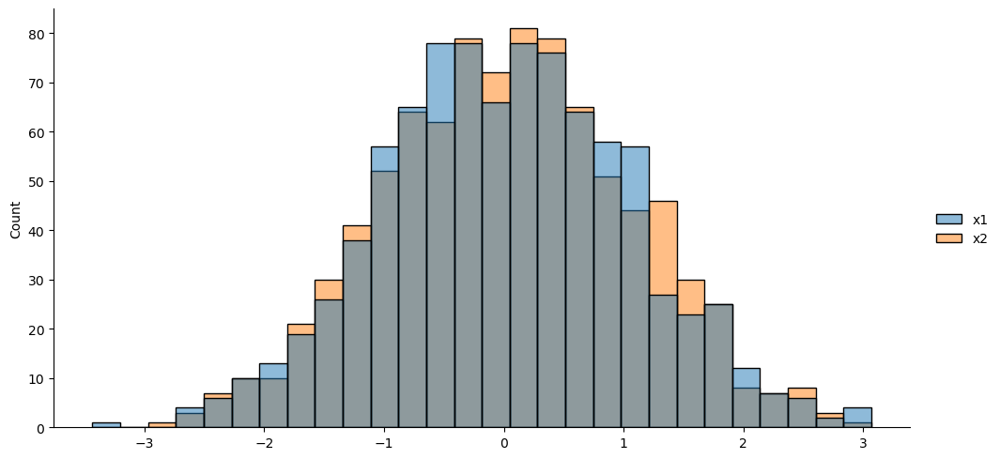

In [31]:
sns.displot(data=df02, kind='hist', aspect=2)
plt.show()

Yes, the marginal distributions appear symmetric.

### 2e)

Create CONDITIONAL KDE plots using Seaborn to show the **conditional densities** of each numeric column **GIVEN** the non-numeric column. The non-numeric column **must** be associated with the KDE color.

You may create separate figures for each histogram based on the WIDE FORMAT data **OR** reshape the data into LONG FORMAT and create separate FACETS for each variable. You **CANNOT** use for-loops to create the separate histograms.

Do the CONDITIONAL DISTRIBUTIONS appear DIFFERENT according to the CONDITIONAL KDE plot?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the color to a column in the data?

*HINT*: What do you need to set to make sure the SAMPLE SIZE effect is removed?

#### 2e) - SOLUTION

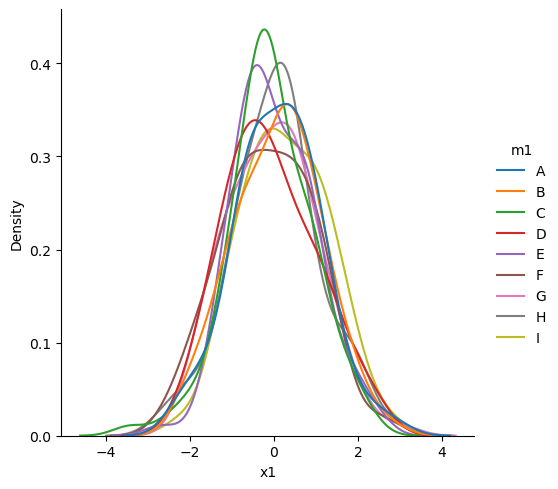

In [32]:
sns.displot(data=df02, x='x1',hue='m1', kind='kde', common_norm=False)
plt.show()

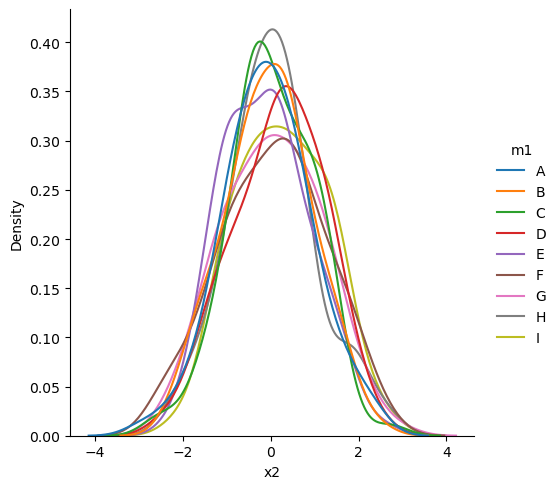

In [33]:
sns.displot(data=df02, x='x2',hue='m1', kind='kde', common_norm=False)
plt.show()

The CONDITIONAL DISTRIBUTIONS appear more or less same to the CONDITIONAL KDE plot as normal distribution or bell shaped curve.
(One thing I want to mention to avoid confusion in general that whenever I say normal distribution, I usually mean a bell shaped curve as we actually don't know so far whether it would be normal distribution or a t or chi square distribution with proper degress of freedom.)

`hue` is responsible to add colors corresponding to different categories. `common_norm=False` removes the sample size effect.

### 2f)

Create BOX PLOTS using Seaborn to visualize the **summary statistics** of the numeric columns **GIVEN** the non-numeric column.

You may create separate figures for each boxplot based on the WIDE FORMAT data **OR** reshape the data into LONG FORMAT and create separate FACETS for each variable. You **CANNOT** use for-loops to create the separate boxplots.

Do the CONDITIONAL DISTRIBUTIONS appear DIFFERENT according to the BOX PLOT?

#### 2f) - SOLUTION

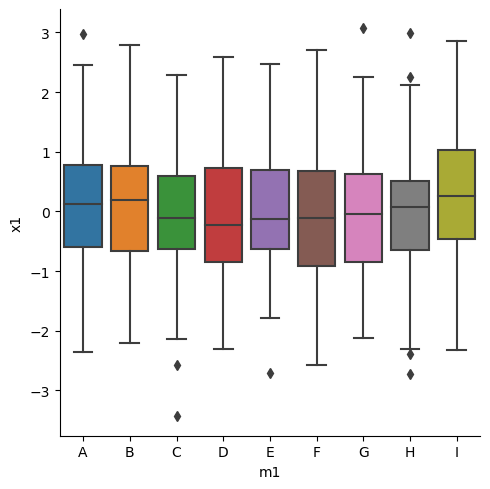

In [34]:
sns.catplot(data=df02, x='m1', y='x1', kind='box')
plt.show()

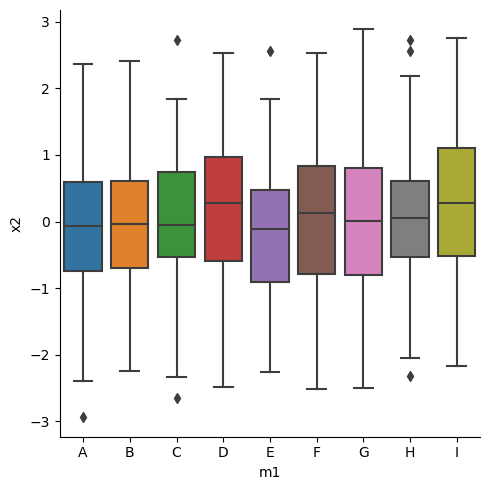

In [35]:
sns.catplot(data=df02, x='m1', y='x2', kind='box')
plt.show()

Medians vary accross categories. D,F,G,I have the high variabilities and H is the least variable for x1 and x2 both.

### 2g)

Although there are several other CONDITIONAL DISTRIBUTION related figures to make, let's shift focus to the RELATIONSHIP between two continuous variables.

Create a scatter plot between the continuous variables using Seaborn.

Can you see any clear relationships between the two?

#### 2g) - SOLUTION

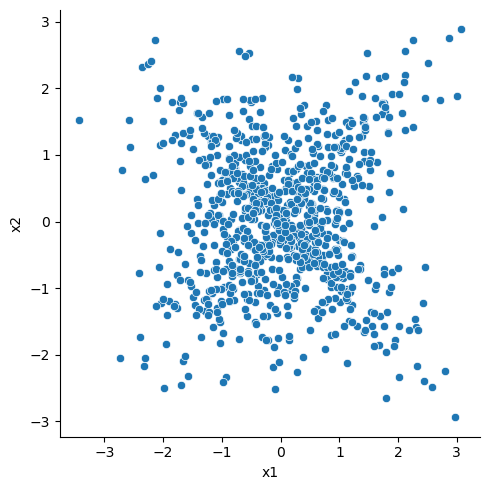

In [36]:
sns.relplot(data=df02, x= 'x1', y='x2')

plt.show()

I can't see a clear relationship here.

### 2h)
Let's now check if the continuous variable relationship depends on the non-numeric variable.

Create a scatter plot between the continuous variables using Seaborn. Color the markers based on the non-numeric column to study if the relationship CHANGES across the categories.

Does the CONDITIONAL RELATIONSHIP appear DIFFERENT across the CATEGORIES?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the color to a column in the data?

#### 2h) - SOLUTION

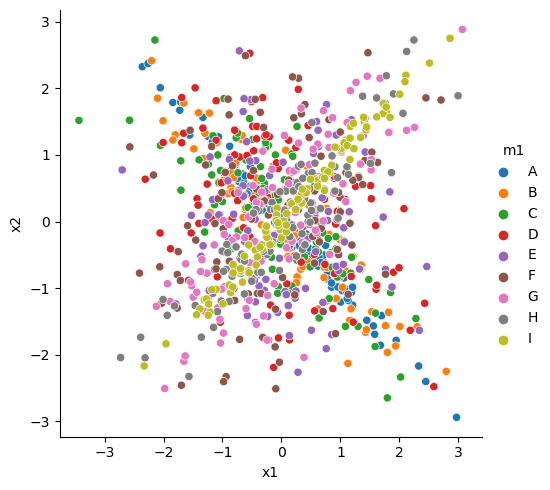

In [37]:
sns.relplot(data=df02, x= 'x1', y='x2', hue='m1')

plt.show()

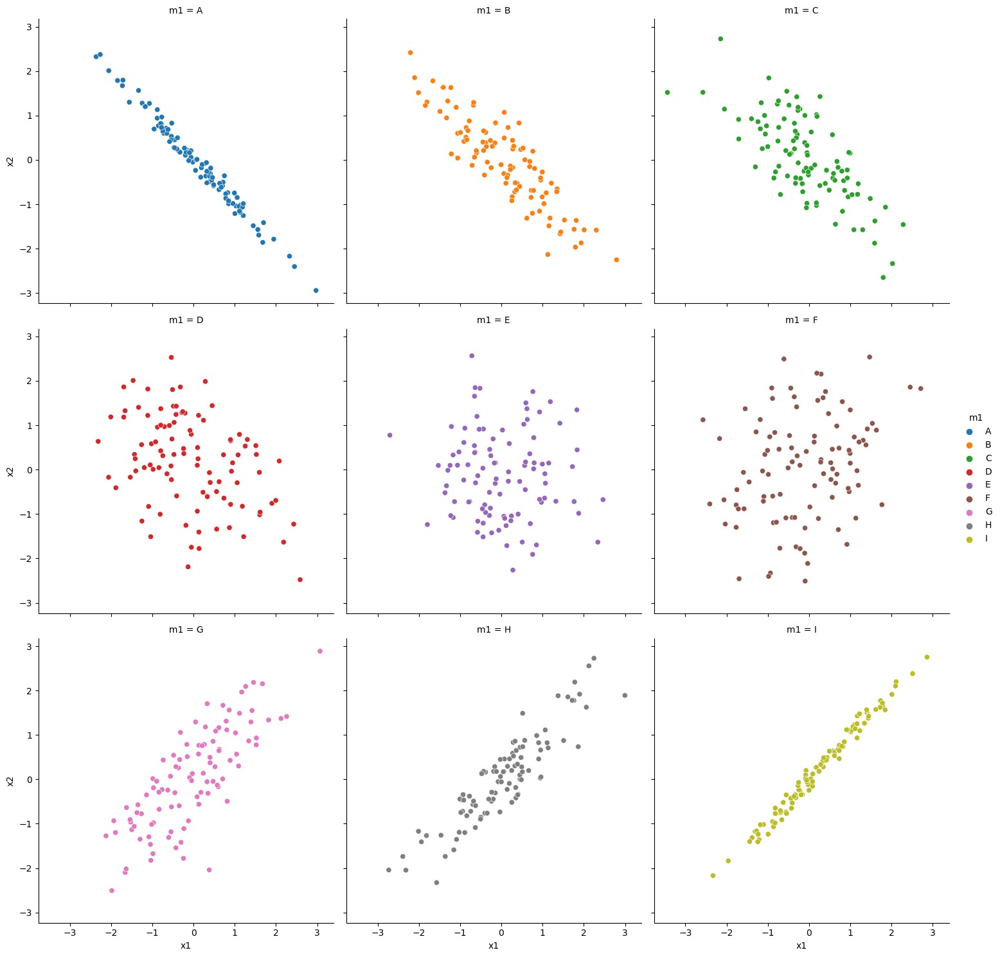

In [38]:
sns.relplot(data=df02, x= 'x1', y='x2', col='m1',hue='m1', col_wrap=3)

plt.show()

Concluding based on color was also difficult as we have a lot of different values in categories so I used column seperation. We can see a positive linear trend b/w x1 and x2 for m1=G,H,I(it seems increasing correlation value by view) and negative linear trend b/w x1 and x2 for m1=A,B,C(it seems increasing correlation value by view) and no relation for m1=D,E,F.

`hue` and `col` seaborn argument allows you to ASSOCIATE or *link* the color to a column in the data.

### 2i)

Let's include a **TREND** line within the scatter plot to help visualize the linear relationship between the two continuous variables. Let's begin by IGNORING the potential influence of the non-numeric column.

Create a scatter plot which includes a trend line to show the linear relationship between the two numeric columns. You should **NOT** color based on the non-numeric columnn.

What kind of relationship does the TREND line represent when the non-numeric column is ignored?

#### 2i) - SOLUTION

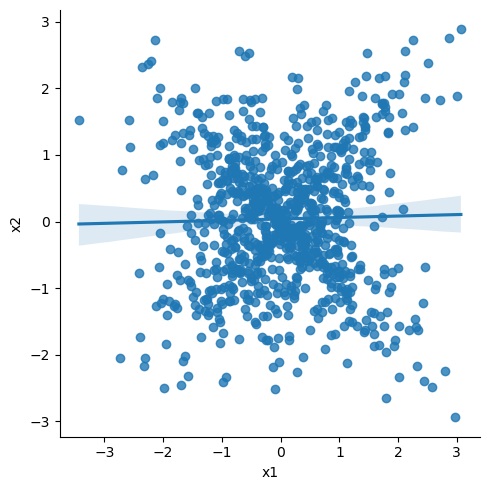

In [39]:
sns.lmplot(data=df02, x= 'x1', y='x2')

plt.show()

A line almost parallel to `x` axis but appears to be little positive.

### 2j)

Let's now include **TREND** lines that are associated with the categories of the non-numeric column.

Create a scatter plot which includes trend lines to show the linear relationship between the numeric columns. Color the markers and the trend lines based on the non-numeric column.

Does the CONDITIONAL RELATIONSHIP appear DIFFERENT across the CATEGORIES?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the color to a column in the data?

#### 2j) - SOLUTION

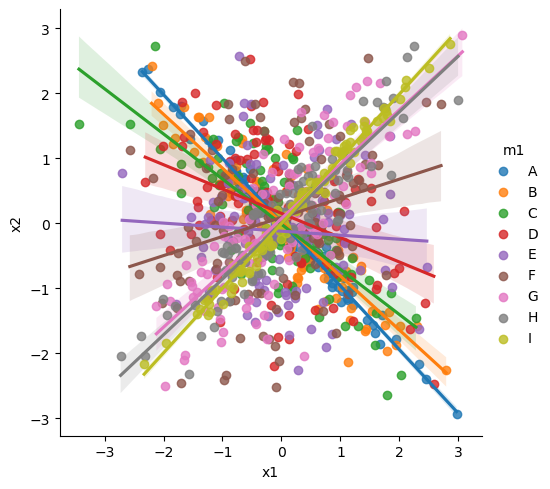

In [40]:
sns.lmplot(data=df02, x= 'x1', y='x2',hue='m1')

plt.show()

We can see a positive linear trend b/w x1 and x2 for m1=F,G,H,I(it seems increasing correlation value by view) and negative linear trend b/w x1 and x2 for m1=A,B,C,D,E(it seems increasing correlation value by view).

`hue` seaborn argument allows us to ASSOCIATE or *link* the color to a column in the data.

### 2k)

Lastly, let's FACET by the non-numeric column!

Create a scatter plot which includes trend lines to show the linear relationship between the numeric columns. Color the markers and trend lines **and** FACET based on the non-numeric column. The color and facets are therefore associated with the SAME variable.

The facets should have 3 columns per row.

Does the CONDITIONAL RELATIONSHIP appear DIFFERENT across the CATEGORIES?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the color to a column in the data?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the COLUMN FACET to a column in the data?

#### 2k) - SOLUTION

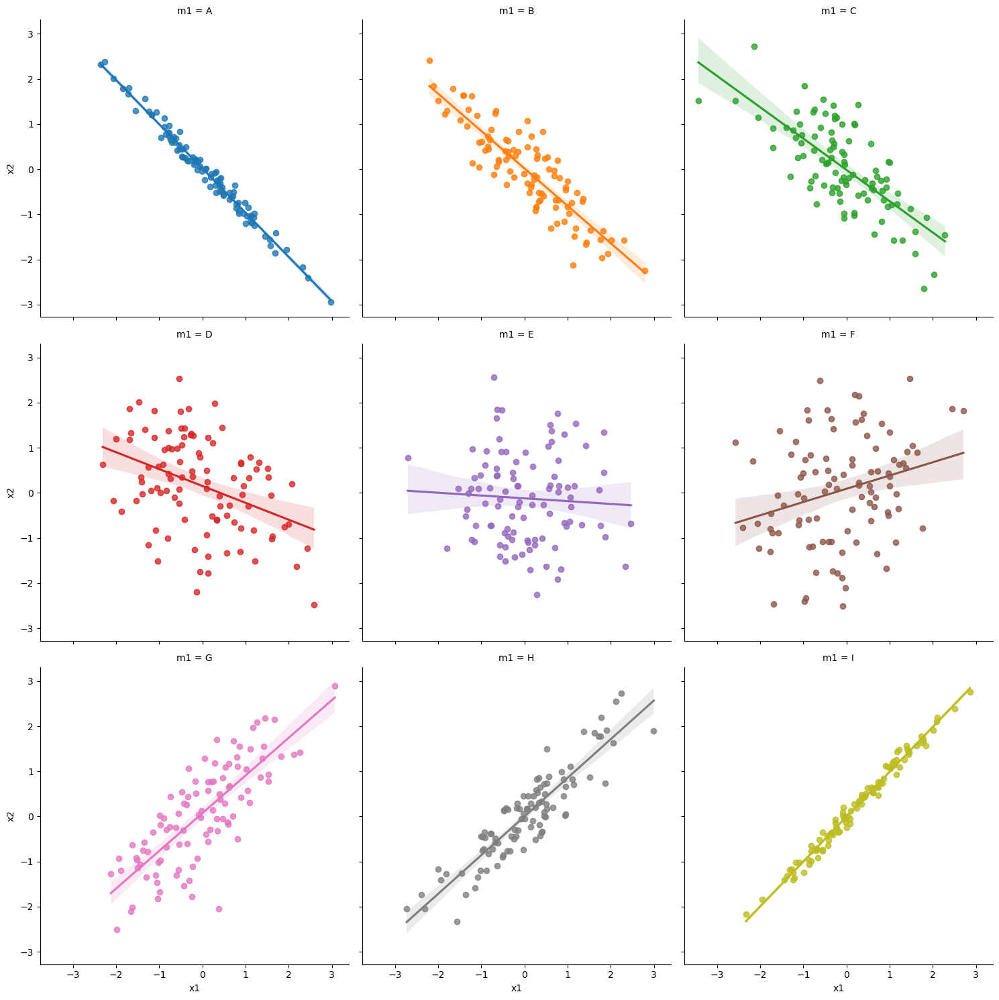

In [41]:
sns.lmplot(data=df02, x= 'x1', y='x2', col='m1',hue='m1', col_wrap=3)

plt.show()

We can see a positive linear trend b/w x1 and x2 for m1=F,G,H,I(it seems increasing correlation value by view) and negative linear trend b/w x1 and x2 for m1=A,B,C,D,E(it seems increasing correlation value by view).

`hue` and `col` seaborn argument allows us ASSOCIATE or *link* the COLUMN FACET to a column in the data.

## Problem 03

You will continue working with the data from Problem 02 to explore the relationship between the two continuous variables. 

### 3a)

Linear relationships can be summarized by calculating the **correlation coefficient** between the numeric columns. The correlation coefficients can be visualized as correlation plots via heat maps. However, let's first practice calculating the correlation matrix between the two numeric columns in `df02`.

Display the correlation matrix for the numeric columns in `df02` to the screen. You do NOT need to assign the correlation matrix to an object.

#### 3a) - SOLUTION

In [42]:
df02.corr(numeric_only=True)

,x1,x2
x1,1.000000,0.021982
x2,0.021982,1.000000


### 3b)

Let's now VISUALIZE the correlation plot as a heat map!

Create a correlation plot between the numeric columns in `df02`. The correlation plot must be created using Seaborn. You must use a DIVERGING color palette with the **correct** bounds and midpoint. The correlation plot **must** be annotated.

You **must** ignore the non-numeric column for this correlation plot.

#### 3b) - SOLUTION

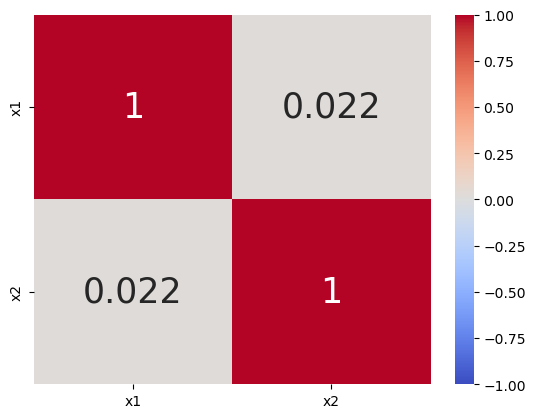

In [43]:
fig, ax = plt.subplots()

sns.heatmap(data = df02.corr(numeric_only=True),
            vmin=-1, vmax=1, center = 0,
            cmap='coolwarm',
            annot=True, annot_kws={'size': 25},
            ax=ax)

plt.show()

### 3c)

Let's now examine if the correlation plot CHANGES across the categories of the non-numeric column. However, let's practice calculating the **grouped** correlation matrix BEFORE visualizing the correlation plot.

Display the **grouped** correlation matrix for the numeric columns in `df02` to the screen. You **must** group by the non-numeric column. You do NOT need to assign the correlation matrix to an object.

#### 3c) - SOLUTION

In [44]:
the_groups = df02.m1.unique().tolist()
corr_per_group = df02.groupby(['m1']).corr()

corr_per_group

x1        x2
m1                       
A  x1  1.000000 -0.991282
   x2 -0.991282  1.000000
B  x1  1.000000 -0.880486
   x2 -0.880486  1.000000
C  x1  1.000000 -0.722998
   x2 -0.722998  1.000000
D  x1  1.000000 -0.395593
   x2 -0.395593  1.000000
E  x1  1.000000 -0.059890
   x2 -0.059890  1.000000
F  x1  1.000000  0.270515
   x2  0.270515  1.000000
G  x1  1.000000  0.785730
   x2  0.785730  1.000000
H  x1  1.000000  0.902762
   x2  0.902762  1.000000
I  x1  1.000000  0.992068
   x2  0.992068  1.000000

### 3d)

Let's now VISUALIZE the **grouped** correlation plot!

Create a **grouped** correlation plot between the numeric columns in `df02`. You **must** group by the non-numeric column. The separate categories on the non-numeric column must be associated with separate subplots. The subplot title must be specified correctly to make it clear which subplot is associated with which value of the non-numeric column. You must use a DIVERGING color palette with the **correct** bounds and midpoint. The correlation plot **must** be annotated.

#### 3d) - SOLUTION

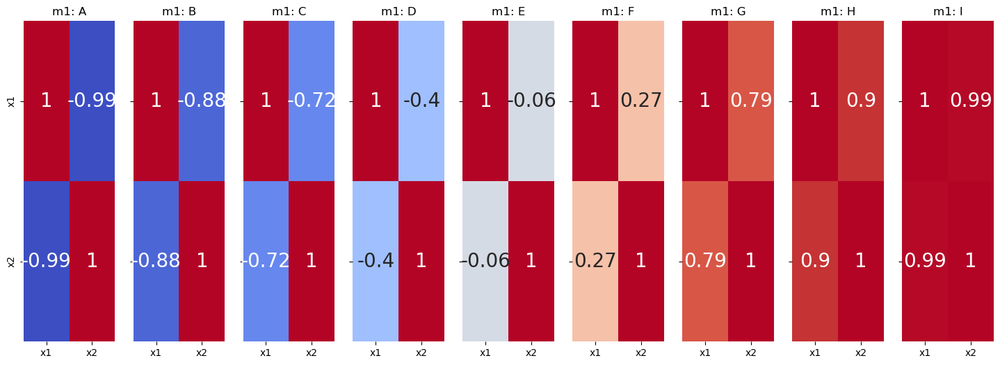

In [45]:
fig, axs = plt.subplots(1, len(the_groups), figsize=(18, 6), sharex=True, sharey=True )

for ix in range(len(the_groups)):
    sns.heatmap( data = corr_per_group.loc[ the_groups[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 20},
                 ax=axs[ix] )
    
    axs[ ix ].set_title('m1: %s' % the_groups[ ix ] )

plt.show()


### 3e)

You have visualized the distributions and relationship between the continuous variables in `df02` several ways. Let's conclude by working with a plot type that combines both aspects into a single graphic.

Create a PAIRS PLOT to show the marginal histograms and scatter plot between the numeric columns in `df02`. You **must** ignore the non-column.

#### 3e) - SOLUTION

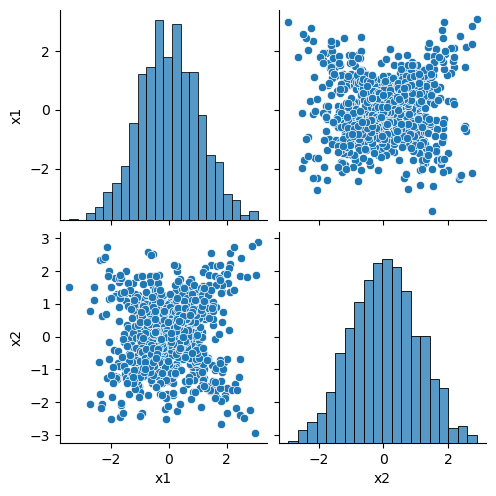

In [46]:
sns.pairplot(data = df02)

plt.show()


### 3f)

CONDITIONAL DISTRIBUTIONS and CONDITIONAL RELATIONSHIPS can be shown within a PAIRS PLOT. The non-numeric column can be associated with COLOR which creates separate colored CONDITIONAL DISTRIBUTIONS and separate colored MARKERS within the SCATTER PLOTS. You must COLOR the PAIRS PLOT by the non-numeric column.

*HINT*: What do you need to set to make sure the SAMPLE SIZE effect is removed?

#### 3f) - SOLUTION

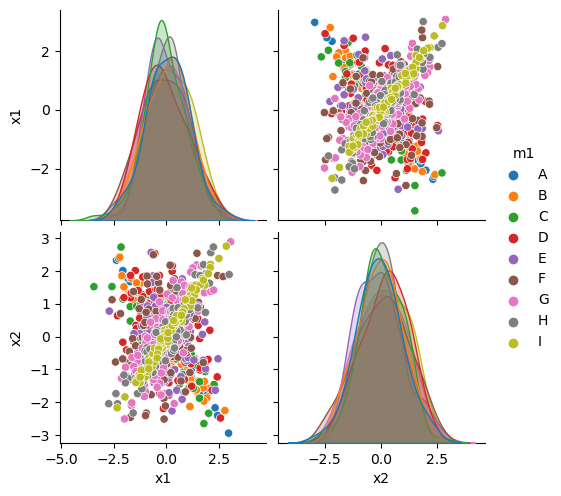

In [47]:
sns.pairplot(data = df02, hue='m1')

plt.show()

### 3g)

You have visually explore the relationship between the numeric columns many different ways. You ignored the non-numeric column, as well as examined if the relationship CHANGED across the categories of the non-numeric column.

Which plot type did you feel was the easiet for identifying if the relationship changed across the categories of the non-numeric column?

#### 3g) - SOLUTION

Here we have 9(little big) different responses in category m1 and hence I feel corr plot or lm plot sperated on different columns or rows are better to identify relationships.

## Problem 04

### 4a)

Read in the `hw07_prob_04.csv` CSV file and assign it to the `df04` object.

#### 4a) - SOLUTION

In [48]:
df04=pd.read_csv("hw07_prob_04.csv")

### 4b)

Perform the ESSENTIAL Exploratory Data Analysis (EDA) tasks.

Add as many cells as you feel are necessary.

#### 4b) SOLUTION

In [49]:
df04.head()

,x01,x02,x03,x04,x05,x06,x07,x08,x09,x10,x11,x12,v
0,1.264427,1.832210,6.131579,0.778511,1.536615,0.553812,1.301533,0.754062,-2.869053,1.461101,0.665066,0.898219,A1
1,1.192453,0.516253,5.152383,-0.270222,0.959529,0.548572,0.397379,1.089376,-2.918729,0.495790,0.769892,0.408373,A1
2,0.687623,0.842107,4.688000,0.844798,-0.121031,0.877528,0.153460,1.711498,-3.579991,1.437499,1.126963,0.176703,A1
3,-0.440204,-0.711678,4.073436,-0.067530,-0.140558,-0.327413,-0.752740,-0.563624,-5.244084,-0.559143,0.034237,-0.055663,A1
4,-0.017212,0.166355,5.063158,0.241118,-0.145682,-0.030299,-0.040292,-0.002534,-4.329521,0.520308,-0.306240,-0.149979,A1


In [50]:
df04.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 633 entries, 0 to 632
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x01     633 non-null    float64
 1   x02     633 non-null    float64
 2   x03     633 non-null    float64
 3   x04     633 non-null    float64
 4   x05     633 non-null    float64
 5   x06     633 non-null    float64
 6   x07     633 non-null    float64
 7   x08     633 non-null    float64
 8   x09     633 non-null    float64
 9   x10     633 non-null    float64
 10  x11     633 non-null    float64
 11  x12     633 non-null    float64
 12  v       633 non-null    object 
dtypes: float64(12), object(1)
memory usage: 64.4+ KB


In [51]:
df04.shape

(633, 13)

In [52]:
df04.nunique()

x01    633
x02    633
x03    633
x04    633
x05    633
x06    633
x07    633
x08    633
x09    633
x10    633
x11    633
x12    633
v        3
dtype: int64

In [53]:
df04.isna().sum()

x01    0
x02    0
x03    0
x04    0
x05    0
x06    0
x07    0
x08    0
x09    0
x10    0
x11    0
x12    0
v      0
dtype: int64

In [54]:
df04.v.value_counts()

A1    211
B2    211
C3    211
Name: v, dtype: int64

We have 633 rowsa divided equally into 3 categories A1,B2,C3. No col has any missing value.

### 4c)

Create a BAR CHART using Seaborn to show the COUNTS for the non-numeric column in `df04`.

Are the unique values BALANCED?

#### 4c) - SOLUTION

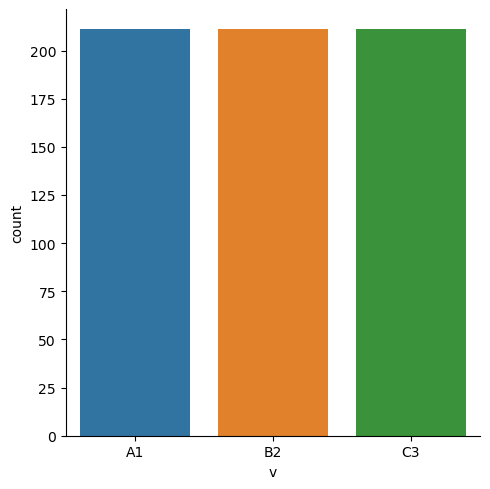

In [55]:
sns.catplot(data=df04, x='v', kind='count')
plt.show()


All categories have equal count of 211.

### 4d)

It is best to study the marginal distributions and then conditional distributions associated with continuous variables (numeric columns) **BEFORE** exploring the relationships between them. However, we will modify the typical EDA workflow for this problem. Let's jump to using the PAIRS PLOT which allows exploring distributions and relationships within a single graphic. We will revisit the distributions in more detail later.

Create a PAIRS PLOT associated with all numeric columns in `df04` using Seaborn.

What does this specific PAIRS PLOT reveal about the variables and their relationships?

#### 4d) - SOLUTION

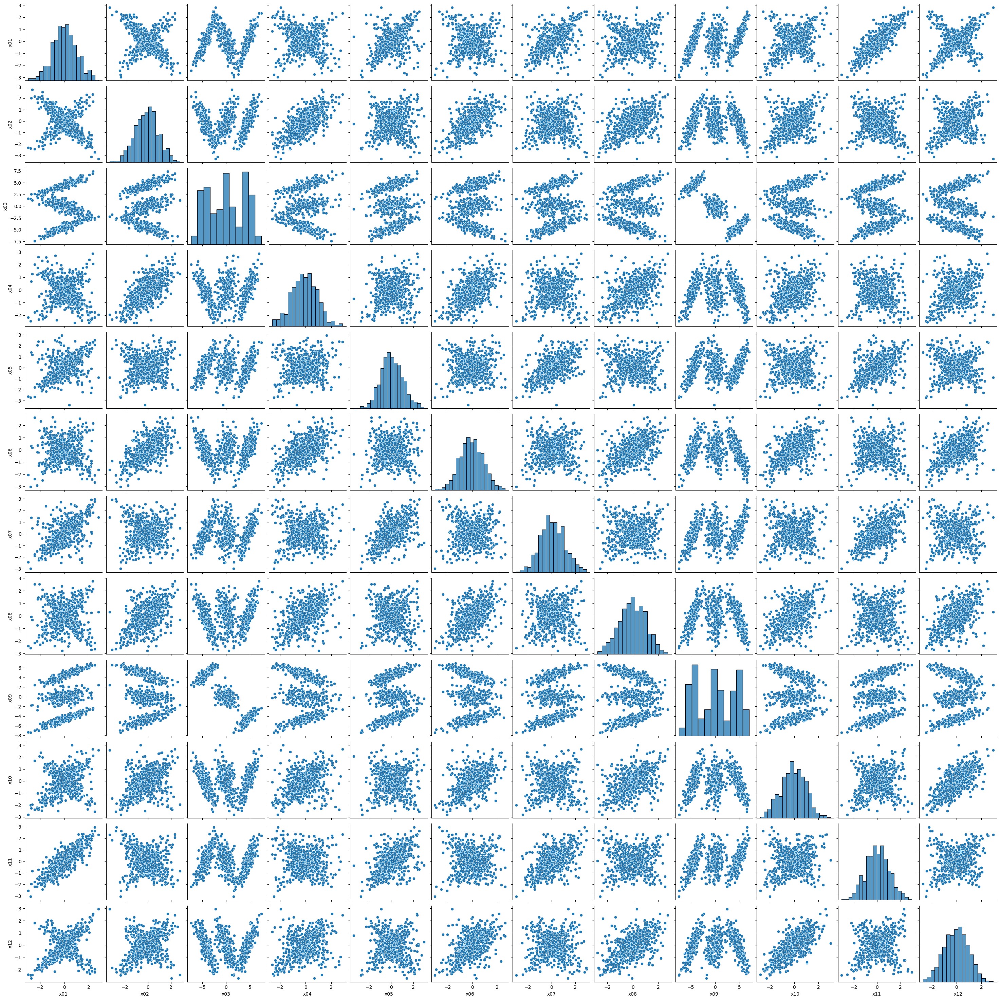

In [56]:
sns.pairplot(data = df04)

plt.show()

We see that the main diagonal of the grid contains histogram/distribution of each variable. We see a lot of bell shaped histogram except x03,x09. The off-diagonal cells of the grid contain scatterplots of one variable against another. These scatterplots display how two different variables relate to each other. For most of the cases, we can't see any particular relationship. We can see linear relation in x2 vs x4, x1 vs x5 to name a few.

### 4e)

Let's now examine if the non-numeric column impacts the continuous variables. Create a PAIRS PLOT for the numeric columns and COLOR based on the non-numeric column using Seaborn.

What does this specific grouped PAIRS PLOT reveal about the impact of the non-numeric column on the continuous variables?

*HINT*: What do you need to set to make sure the SAMPLE SIZE effect is removed?

#### 4e) - SOLUTION

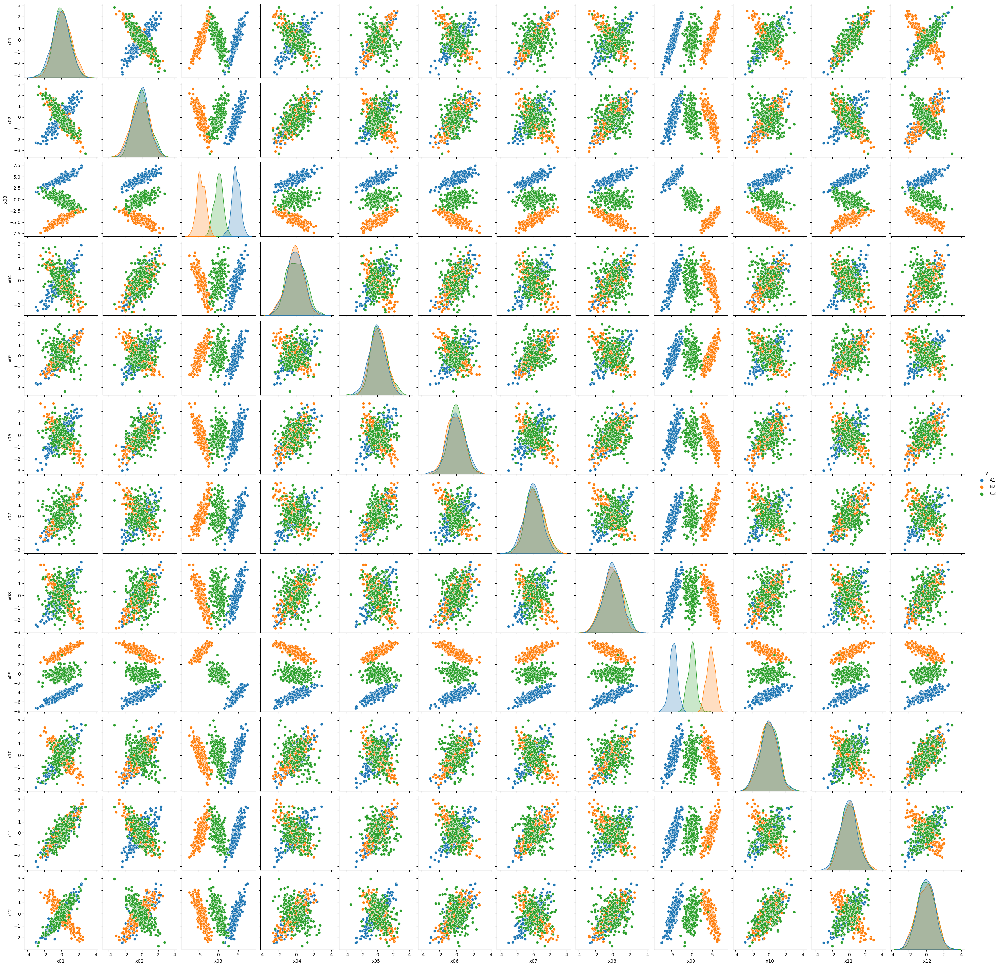

In [57]:
sns.pairplot(data = df04, hue='v', 
             diag_kws={'common_norm': False})

plt.show()

We see that the main diagonal of the grid contains histogram/distribution of each variable. Initially we saw a lot of bell shaped histogram except x03,x09. After the effect of categorical grouping x3, x9 are divided into 3 distinct bell shaped curves. The off-diagonal cells of the grid contain scatterplots of one variable against another. These scatterplots display how two different variables relate to each other. For most of the cases, we can't see any particular relationship. Initially we saw linear relation in x2 vs x4, x1 vs x5 to name a few. Now we start seeing linear relationship across categories e.g., x7 vs x9. In some cases like x10 vs x11 it is still hard to apprehend whether there is relationship among blue points or not as the color overlaps but we can see relationship in orange and green.

### 4f)

Let's now summarize the **linear relationships** between numeric columns using a CORRELATION PLOT. You do NOT need to display the correlation matrix first this time. Instead, we will jump straight to visualizing the CORRELATION PLOT.

Create a correlation plot between the numeric columns in `df04`. The correlation plot must be created using Seaborn. You must use a DIVERGING color palette with the **correct** bounds and midpoint.

Do you feel this correlation plot needs to be annotated? Try annoting the correlation plot and then NOT annotating it. Are you able to reach the same conclusions without the annotated text?

You **must** ignore the non-numeric column for this correlation plot.

#### 4f) - SOLUTION

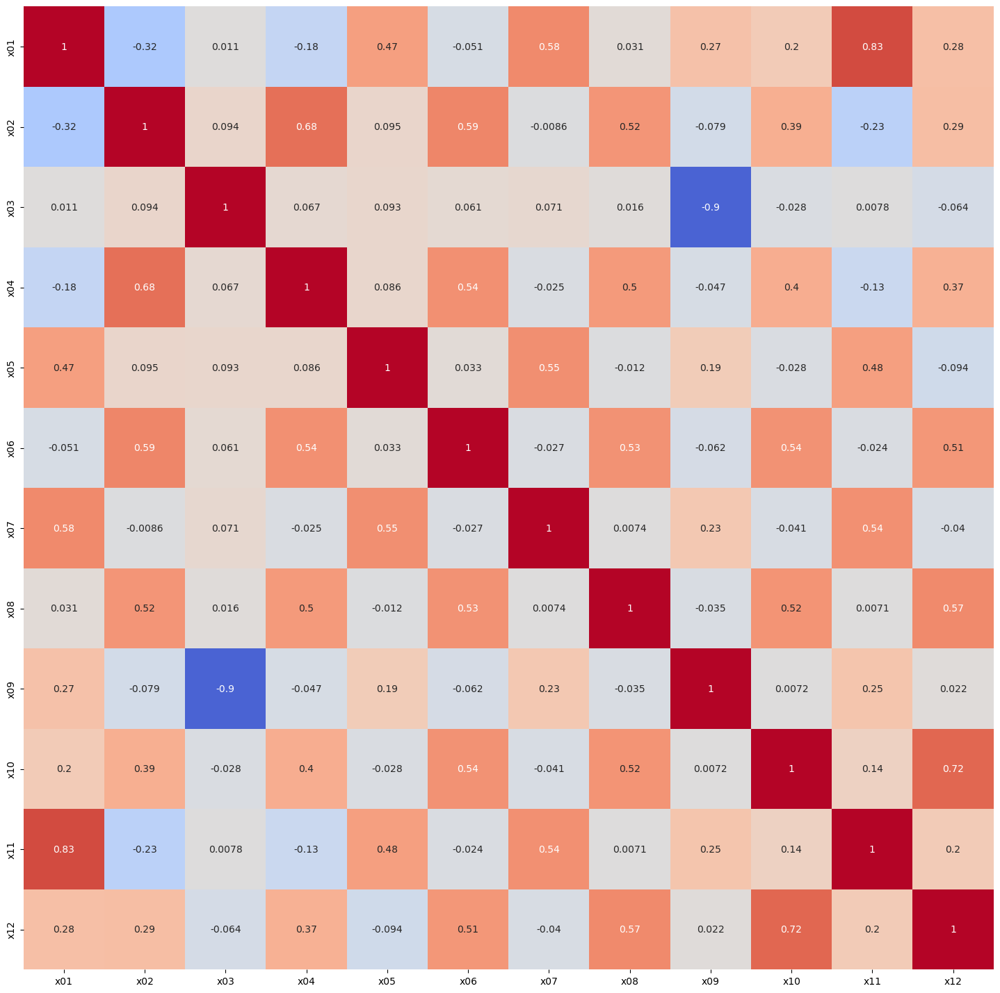

In [58]:
fig, ax = plt.subplots(figsize=(18,18))

sns.heatmap(data = df04.corr(numeric_only=True),
            vmin=-1, vmax=1, center = 0,
            cmap='coolwarm',
            annot=True, annot_kws={'size':10},
            cbar=False,
            ax=ax)

plt.show()

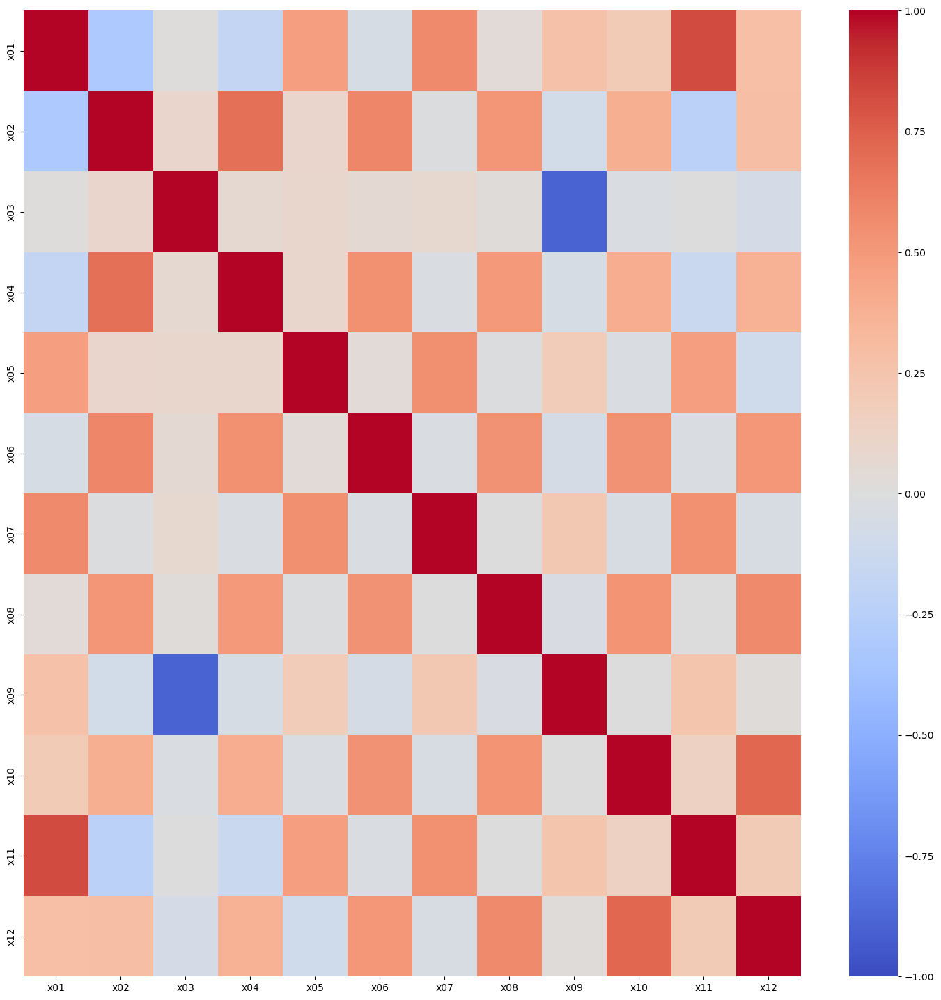

In [59]:
fig, ax = plt.subplots(figsize=(18,18))

sns.heatmap(data = df04.corr(numeric_only=True),
            vmin=-1, vmax=1, center = 0,
            cmap='coolwarm',
            annot=False, annot_kws={'size':10},
            cbar=True,
            ax=ax)

plt.show()

I feel annotation is better. Without annotation definitely need colorbar on still it is difficult.

### 4g)

Let's now **group** the correlation plot by the non-numeric column.

Create a **grouped** correlation plot between the numeric columns in `df04`. You **must** group by the non-numeric column. The separate categories on the non-numeric column must be associated with separate subplots. The subplot title must be specified correctly to make it clear which subplot is associated with which value of the non-numeric column. You must use a DIVERGING color palette with the **correct** bounds and midpoint.

Do you feel this correlation plot needs to be annotated? Try annoting the correlation plot and then NOT annotating it. Are you able to reach the same conclusions without the annotated text?

#### 4g) - SOLUTION

In [60]:
the_groups1 = df04.v.unique().tolist()
corr_per_group1 = df04.groupby(['v']).corr()

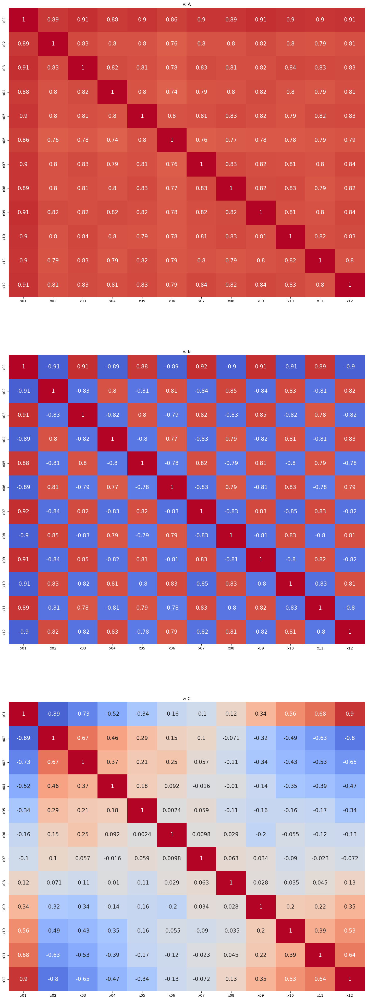

In [61]:
fig, axs = plt.subplots(len(the_groups1),1, figsize=(18,50) )

for ix in range(len(the_groups1)):
    sns.heatmap( data = corr_per_group1.loc[ the_groups1[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size':15 },
                 ax=axs[ix] )
    
    axs[ ix ].set_title('v: %s' % the_groups[ ix ] )

plt.show()

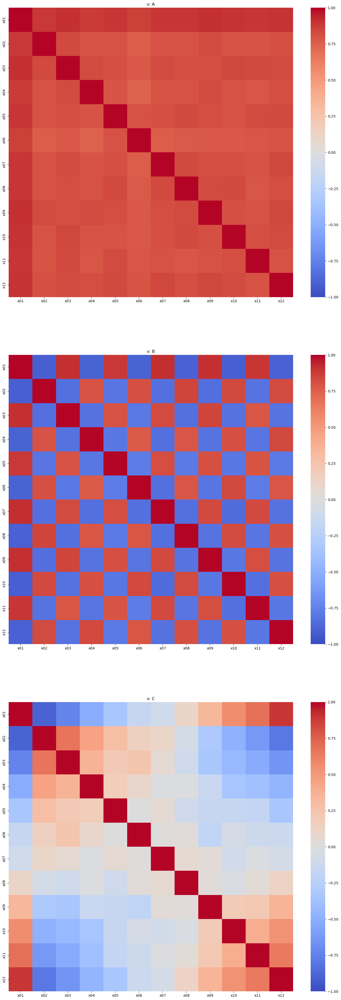

In [62]:
fig, axs = plt.subplots(len(the_groups1),1, figsize=(18,50) )

for ix in range(len(the_groups1)):
    sns.heatmap( data = corr_per_group1.loc[ the_groups1[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=True,
                 annot=False, annot_kws={'size':15 },
                 ax=axs[ix] )
    
    axs[ ix ].set_title('v: %s' % the_groups[ ix ] )

plt.show()

I feel annotation is better. Without annotation definitely need colorbar on still it is difficult.

### 4h) 

What were the pros and cons of exploring the RELATIONSHIPS between numeric columns with a PAIRS PLOTS for this data set?

What were the pros and cons of exploring the LINEAR relationships between the numeric columns with CORRELATION PLOTS for this data set?

#### 4h) - SOLUTION

**Pair plot:**

*Pros*

 * We can quickly determine which numeric columns have some relationship in general and then across categories
 * There are some grouping which doesn't show any relationship without grouping. After grouping by categories the picture gets clearer.
 * We can see the marginal distribution among numeric columns.
 * If we have some non-linear relationship we can see that in the scatter plot. 

*Cons*

 * If a lot of data is clustered at one place then it is hard to find out a relationship even after grouping by categories.
 * The level of correlation is hard to apprehend sometime.

**Pair plot:**

*Pros*

 * We can quickly determine the correlation strength.
 * If we see some strong association. $|\text{correlation}| \to 1$ then we can get some idea about linear relationship.
 * I think apprehending linear strength is faster here.

*Cons*

 * Can't say anything about the distribution shape.
 * Sometimes dealing with just number is boring and if we ommit annotate a lot of relations might be missed/miscalculated.
 * If we have some non-linear relationship the correlation plot will still give you some number(might be week association number) and we might think that there is a possible association. So it is highly uncertain when $|\text{correlation}| \to 0$


## Problem 05

Let's now return explore the continuous variable distributions in depth for `df04`. You have seen that there are more than just a few continuous variables in this data set! It might seem like we need to perform a lot of tedious actions to explore all of the variables. But, you do NOT need to manually create all figures! You do NOT need to resort to for-loops either! Instead, the data can be RESHAPED from the current WIDE-FORMAT to LONG-FORMAT. This allows associating Seaborn's FACETS with the continuous variables!

### 5a)

First, display the number of rows and columns in `df04` as a reminder.

#### 5a) - SOLUTION

In [63]:
df04.shape

(633, 13)

### 5b)

Reshape the `df04` WIDE-FORMAT DataFrame into LONG-FORMAT. The numeric columns of `df04`. MUST be "gathered up" or STACKED on top of each other. The non-numeric column must **NOT** be gathered up. You **MUST** include a column named `rowid` that corresponds to the row index. The `rowid` column must **NOT** be gathered up with the other numeric columns.

Assign the LONG-FORMAT data set to the `lf04` object.

Display the `.info()` method for the LONG-FORMAT object to the screen.

#### 5b) - SOLUTION

In [64]:
df04_features = df04.select_dtypes('number').copy()
df04_features.melt(ignore_index=False)
lf04 = df04_features.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid'])

In [65]:
lf04.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7596 entries, 0 to 7595
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   rowid     7596 non-null   int64  
 1   variable  7596 non-null   object 
 2   value     7596 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 178.2+ KB


### 5c)

How many rows and columns are in `lf04`? 

Does the number of rows "make sense" given the shape of `df04`?

#### 5c) - SOLUTION

In [66]:
lf04.shape

(7596, 3)

We have 7596 rows. Yes, it makes sense as we have 633 rows for 12 columns hence, $633 \times 12=7596$.

### 5d)

You can now use the LONG-FORMAT data to visually explore the numeric columns in `df04`!

Visualize the marginal distributions for each numeric variable in `df04` using the LONG-FORMAT `lf04` object and Seaborn. You **must** associate the correct newly created "gathered" value column with the `x` axis argument. You **must** associate the column facets with the correct newly created "gathered" variable column. You **must** use 21 bins to create the histograms. The figure should have 4 facets per row. The x and y scales of the facets must be **free** or not-shared across the facets. 

How would you describe the SHAPES of the continuous variable distributions?

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the COLUMN FACET to a column in the data?

#### 5d) - SOLUTION

In [67]:
df04_objects = df04.select_dtypes('object').copy()
id_cols = ['rowid'] + df04_objects.columns.to_list()

In [68]:
df04_lf = df04.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df04_features.columns)

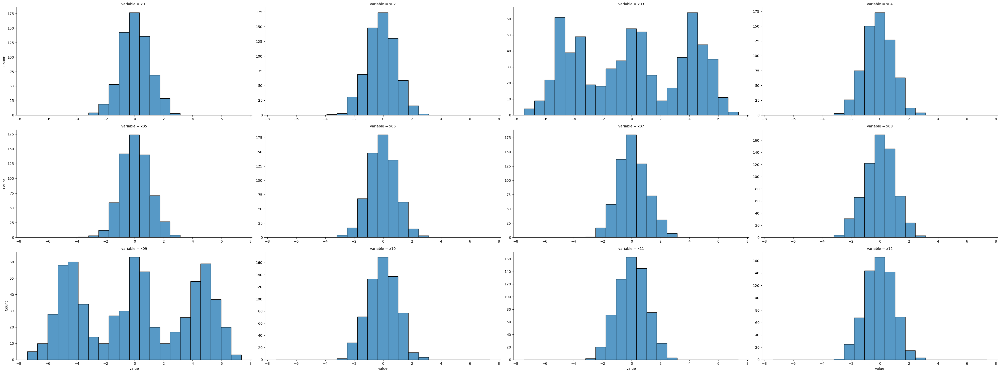

In [69]:
sns.displot( data = df04_lf, x='value', col= 'variable', bins=21, aspect=2,col_wrap= 4,
           facet_kws= {'sharex': False, 'sharey': False})

plt.show()

### 5e)

The `lf04` LONG-FORMAT DataFrame has a separate column for the non-numeric column in `df04`. Thus, it was NOT "gathered" with the numeric columns. You can therefore use the non-numeric column as a GROUPING variable in the visualizations!

Visualize the CONDITIONAL KDE plots for each numeric variable in `df04` within FACETS of a single figure. Each facet must be associated with one of the "original" numeric columns in `df04`. You **must** associate the correct newly created "gathered" value column in the `x` axis argument. You **must** associate the column facets with the correct newly created "gathered" variable column. You **must** associate the "original" `df04` non-numeric column with the CONDITIONAL KDE color. The figure should have 4 facets per row. The x and y scales of the facets must be **free** or not-shared across the facets. 

Do the CONDITIONAL DISTRIBUTIONS appear DIFFERENT across the categories of the non-numeric column? 

*HINT*: Which Seaborn argument allows you to ASSOCIATE or *link* the color to a column in the data?

*HINT*: What do you need to set to make sure the SAMPLE SIZE effect is removed?

#### 5e) - SOLUTION

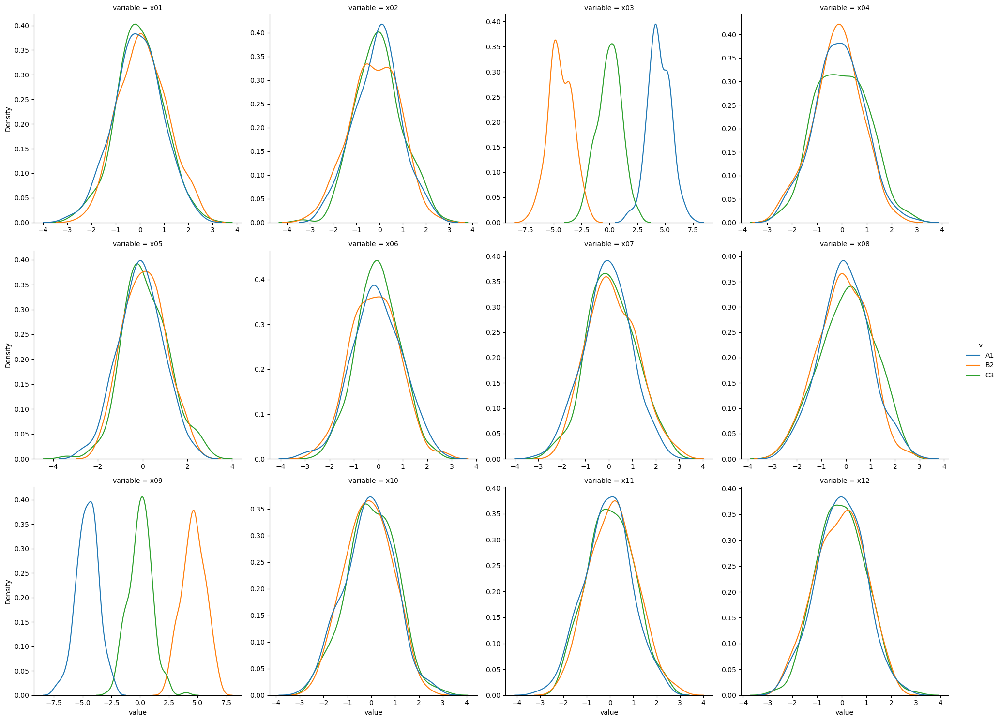

In [70]:
sns.displot(data = df04_lf, x='value', col='variable', kind='kde',
            col_wrap=4, hue='v',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()


Yes, some are distinct across categories. E.g., in x3 the orange and blue ones have a hint of second mode and all three categories here are bell-shaped but concentrated at three different regions, in x9 also all three categories here are bell-shaped but concentrated at three different regions. Then in x2 the orange one has two modes and the highest concentration of orange is little flat in x10. We see these variabilities there.

### 5f)

Although there are multiple conditional distribution plots we should use to fully explore the data, you will conclude this assignment with a BOXPLOT. You will create separate BOXPLOTS for each "original" numeric column within FACETS of a single figure. Each facet must be associated with one of the "original" numeric columns in `df04`. You **must** associate the "original" `df04` non-numeric column with the `x` axis argument. You **must** associate the correct newly created "gathered" value column with the `y` axis argument. You **must** associate the column facets with the correct newly created "gathered" variable column.

Experiment with using shared x and y axis scales across the FACETS and NOT SHARING the x and y axis scales. Which approach seems best for this particular data set?

#### 5f) - SOLUTION

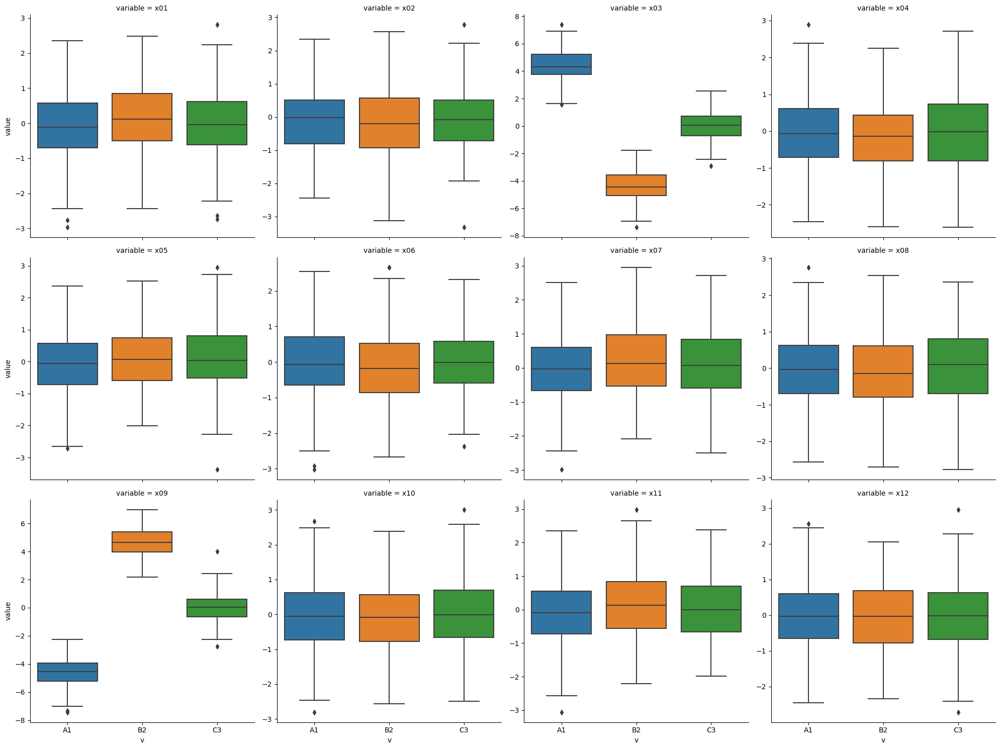

In [71]:
#NOT SHARING the x and y axis scales
sns.catplot(data = df04_lf, x='v', y='value', col='variable', col_wrap=4,
            kind='box',
            sharey=False)
plt.show()

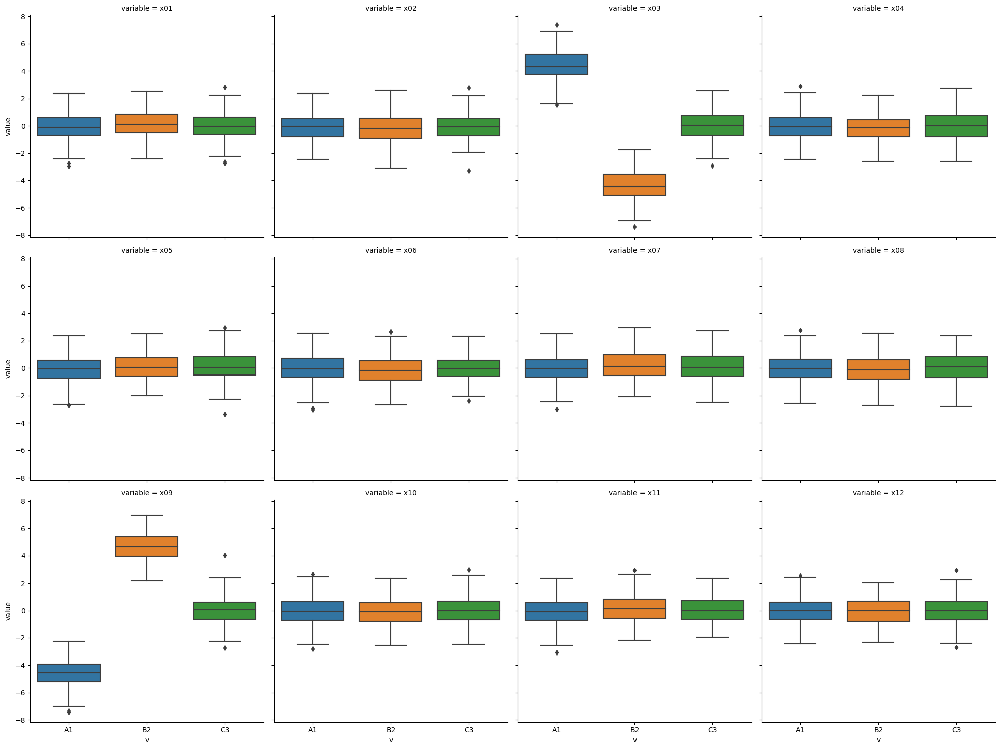

In [72]:
# SHARING the x and y axis scales
sns.catplot(data = df04_lf, x='v', y='value', col='variable', col_wrap=4,
            kind='box')

plt.show()

Not sharing is visually clearer in this condition.

## Problem 06

You must download the data associated with one of the Final Projects from the Canvas site. Save the file(s) in the same directory as this Jupyter notebook. You may use the same project as the previous assignment OR switch to a different project.

Read in the data associated with one of the Final Projects. You previously visually explored MARGINAL behavior. You must now begin to visually explore relationships between variables in the Project data. However, you do NOT need to explore ALL relationships this assignment.

You **MUST** create at least 6 plots which explore relationships between variables. Those plots can be categorical-to-categorical relationships (combinations), categorical-to-continuous relationships, and/or continuous-to-continuous relationships. The exact type of plots you should use depend on the project.

However, 2 of the plots **MUST** involve MORE than 2 variables.

Add as many cells as you feel are necessary.

#### 06) - SOLUTION

In [73]:
df06 = pd.read_csv('training_data.csv')

In [74]:
df06

,X01,X02,X03,X04,X05,X06,X07,X08,X09,X10,...,V21,V22,V23,V24,V25,V26,V27,V28,V29,Y
0,-2.907070,1.266914,-0.332039,-0.248782,0.200432,-0.008683,0.316866,-0.323924,0.030199,-0.205569,...,0.552065,0.489846,1.113175,-0.240931,-0.108875,-0.114766,0.841632,0.104236,-121.810994,1
1,-4.608052,4.672474,0.154697,0.268719,-0.842417,0.055191,0.622848,-0.260097,-0.651079,1.096821,...,1.989505,1.355984,1.656029,2.428749,1.068637,1.945175,0.950544,0.143290,-59.362086,1
2,4.338816,5.684974,1.868370,-1.883006,0.589758,0.932240,-0.646026,0.183410,0.132287,-0.426386,...,2.128248,2.553980,2.661607,2.625942,4.462401,3.621299,0.992381,0.127803,-79.575912,1
3,-1.835062,0.427501,-2.226023,0.700375,-1.144850,1.188100,0.727831,-0.271734,0.003246,0.138308,...,-0.856860,-0.766993,-0.882442,-0.832196,-0.377106,-0.633452,0.964183,0.088978,-139.426151,0
4,13.990969,-3.877269,1.921605,0.162288,2.316402,-0.161137,-0.099180,0.514620,-0.551956,-0.517779,...,-0.333291,0.126656,-0.557930,-0.185135,-0.639549,-0.245234,0.845817,0.172305,-29.433234,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,-3.454719,-0.911378,1.072785,0.845129,1.817682,-0.034388,-0.394277,-0.260803,0.018067,-0.718457,...,-1.041533,-0.585809,-0.831599,0.315496,-2.098443,-0.767479,0.941532,0.112127,-100.512718,0
219,0.493271,2.184699,0.107755,-1.852857,0.329977,0.679100,0.933463,0.110013,0.234102,-0.080677,...,1.599908,1.485953,1.326105,0.738920,1.782694,1.221559,0.965555,0.098206,-118.299085,1
220,-5.009510,-0.488819,0.838883,0.615571,0.069954,-0.365945,-0.290072,0.777958,-0.392741,0.126245,...,-0.769891,-0.384573,-0.894474,-1.071848,-0.755456,-1.001084,0.898706,0.106729,-102.237684,1
221,-2.665672,-0.546497,-0.545406,-0.477273,1.476238,-0.019403,0.280312,0.359992,-0.136810,0.116397,...,-0.092393,-0.962929,-0.580874,-0.750556,-1.618888,-1.083649,0.964139,0.096673,-119.015441,1


In [75]:
df06_features = df06[['X01','X02','Z01','Z02', 'V01', 'V02' ]].copy()
df06_features.melt(ignore_index=False)
lf06 = df06_features.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid'])

In [76]:
lf06.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   rowid     1338 non-null   int64  
 1   variable  1338 non-null   object 
 2   value     1338 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 31.5+ KB


In [77]:
df06_objects = df06.select_dtypes('object').copy()
id_cols = ['rowid'] + df06_objects.columns.to_list()
df06_lf = df06.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df06_features.columns)

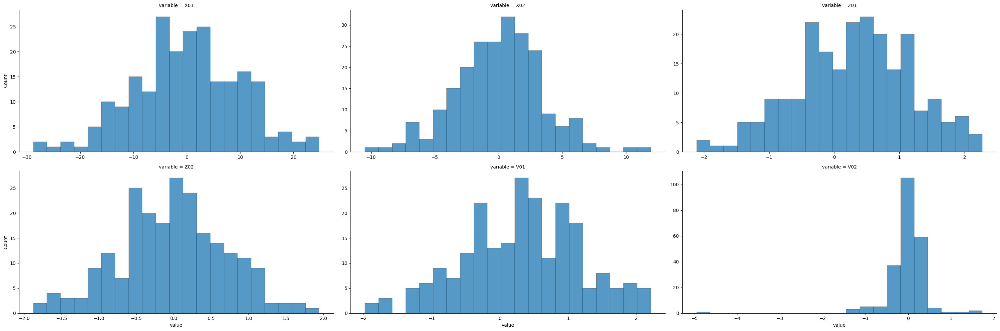

In [ ]:
sns.displot( data = df06_lf, x='value', col= 'variable', bins=21, aspect=2,col_wrap= 3, common_bins=False,
           facet_kws= {'sharex': False, 'sharey': False})

plt.show()

I see more or less normal distribution except V02.

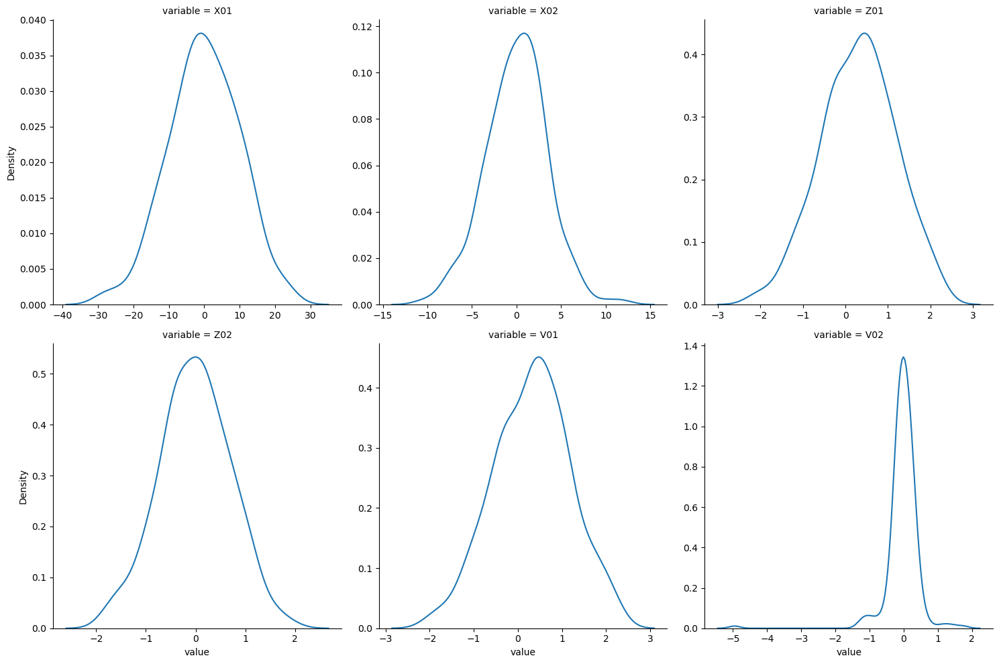

In [79]:
sns.displot(data = df06_lf, x='value', col='variable', kind='kde',
            col_wrap=3, 
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()


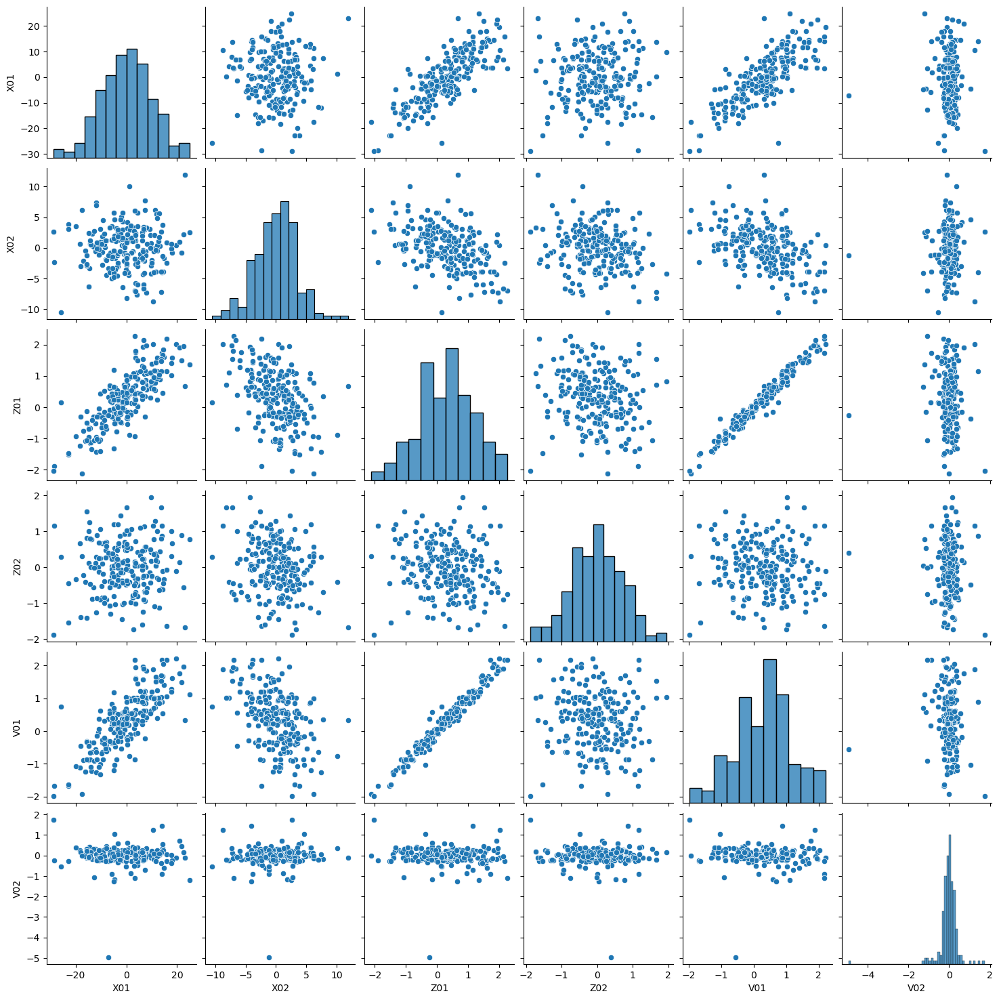

In [80]:
sns.pairplot(data = df06_features, diag_kws={'common_norm': False})

plt.show()

We can see a lot of linear trends, e.g., say in V01 and Z01.

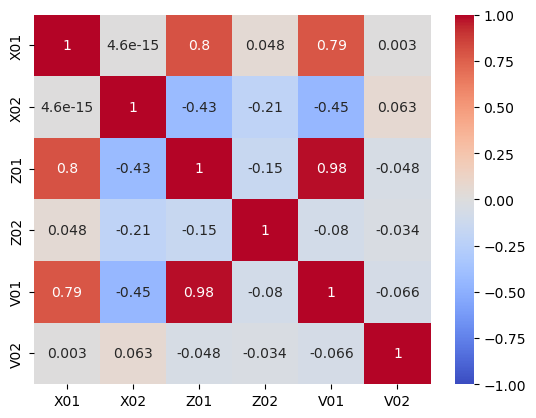

In [81]:
fig, ax = plt.subplots()

sns.heatmap(data = df06_features.corr(numeric_only=True),
            vmin=-1, vmax=1, center = 0,
            cmap='coolwarm',
            annot=True, annot_kws={'size': 10},
            ax=ax)

plt.show()

I have done with pairplots with long format which has more than 6 graphs.

In [82]:
df06_features1 = df06[['X01','X02','Z01','Z02', 'V01', 'V02','Y']].copy()


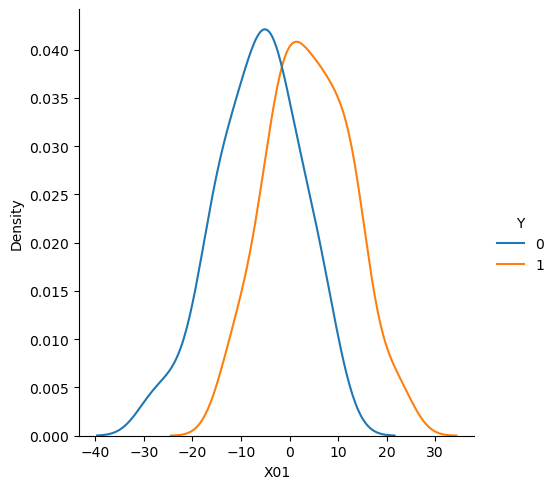

In [83]:
sns.displot(data=df06_features1, x='X01', hue='Y', kind='kde', common_norm=False)

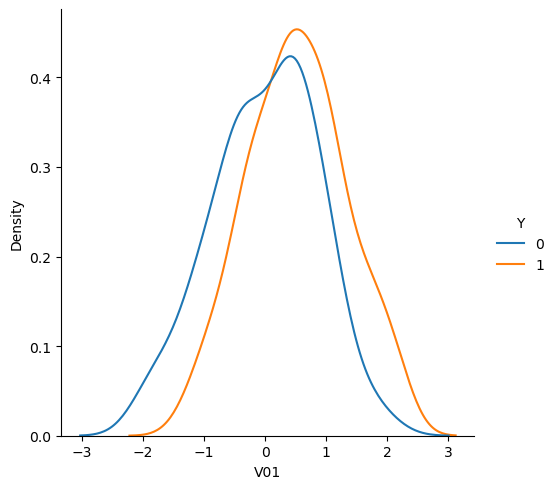

In [84]:
sns.displot(data=df06_features1, x='V01', hue='Y', kind='kde', common_norm=False)